In [1]:
from tomoSegmentPipeline.utils.common import read_array, write_array
from tomoSegmentPipeline.utils import setup

from mwReconstruction.dataloader import destripeDataSet
from mwReconstruction.model import *
from mwReconstruction.losses import Loss
from mwReconstruction.trainer import train


import numpy as np
import matplotlib.pyplot as plt
import random
import mrcfile
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
import os
from glob import glob
import scipy.io as io
# from skimage.metrics import structural_similarity as ssim
# from skimage.metrics import normalized_mutual_information as nmi
from scipy import ndimage
from joblib import Parallel, delayed

PARENT_PATH = setup.PARENT_PATH
ISONET_PATH = os.path.join(PARENT_PATH, 'data/isoNet/')

%matplotlib inline
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

# Load data

In [49]:
# cet_path = os.path.join(ISONET_PATH, 'RAW_dataset/RAW_allTomos_deconv/tomo10.mrc')    
cet_path = os.path.join(ISONET_PATH, 'RAW_dataset/RAW_tomoset/tomo10.mrc') 


my_dataset = destripeDataSet(path = cet_path, logTransform=False)
len(my_dataset)

1

In [104]:
my_dataset.x_data[0][0].shape

torch.Size([464, 928])

In [50]:
input_2d_slice = my_dataset.x_data[len(my_dataset)//2][0].squeeze()
input_2d_slice.shape

fourier_2d_slice = fft.fftshift(fft.fft2(input_2d_slice))

m, n = fourier_2d_slice.size()

In [51]:
symmatrix = make_symmatrix(n, m)  # this is an np.array
symmask = torch.from_numpy(symmatrix).float()

symmask.shape, fourier_2d_slice.shape

(torch.Size([464, 928]), torch.Size([464, 928]))

(array([  1925.,   7107.,  30572.,  92424., 115532.,  58598.,  46992.,
         41890.,  25088.,  10464.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ],
       dtype=float32),
 <BarContainer object of 10 artists>)

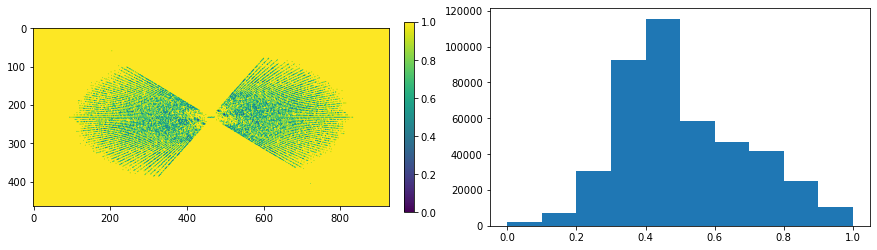

In [52]:
outlier_mask = my_dataset.x_data[len(my_dataset)//2][1].squeeze()
weight_matrix = my_dataset.x_data[len(my_dataset)//2][2].squeeze()
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 4))

plot0 = ax0.imshow(outlier_mask)
plt.colorbar(plot0, ax=ax0, fraction=0.025, pad=0.04)

ax1.hist(weight_matrix.flatten().numpy())

# Code breakdown

We want our neural network to do the following:

1. Embed Fourier space into a higher dimensional space with a non-linearity
2. Perform frequency based attention
3. Perform message passing:
    - Identity for non-MW coefficients
    - Sum of isotropic neighbors for MW coefficients
4. Embed back into Fourier space

Furthermore, we want to work only with the negative part of the spectrum since we want to avoid redundancy given by the fact that we are using real images.

In [53]:
outlier_mask_neg = torch.masked_select(outlier_mask, symmask == -1) # originally hier_mask_neg
weight_matrix_neg = torch.masked_select(weight_matrix, symmask == -1)
outlier_mask_neg.shape

torch.Size([215528])

In [54]:
_x_neg = fourier_2d_slice[symmask==-1].unsqueeze(1)
_x_neg.shape

torch.Size([215528, 1])

In [55]:
in_channels = 1
embedding_channels = 32
conv1 = ConvDic(in_channels, embedding_channels)
relu = nn.ReLU()
conv2 = ConvDic(embedding_channels, embedding_channels)
conv3 = ConvDic(embedding_channels, in_channels)

In [61]:
# Calculate neighbors
aux_neg = make_N_neg_matrix(dr=3,
                            neg_mask=(symmatrix == -1).astype(int),
                            power_mask=outlier_mask.cpu().numpy(),
                        )
N_neg = torch.from_numpy(aux_neg.fillna(-1).to_numpy())
print(N_neg.shape)

torch.Size([215528, 65])


In [33]:
def neg2full_spectrum(x_neg, m, n, aver):
    if m%2==0:
        r = m+1
    else:
        r = m

    if n%2==0:
        s = n+1
    else:
        s = n

    aux_symmatrix = make_symmatrix(s, r)
    aux_symmask = torch.from_numpy(aux_symmatrix).float()
    
    x_neg = x_neg.repeat(2)[0:(aux_symmask==-1).sum()]

    new_img = (aux_symmask).type(torch.complex128)
    new_img[torch.where(aux_symmask==-1)] = x_neg.type(torch.complex128)

    new_img = torch.flip(new_img, [0, 1])

    new_img[torch.where(new_img==1)] = torch.conj(x_neg).type(torch.complex128)
    new_img = torch.flip(new_img, [1, 0])

    new_img[r//2, s//2] = aver

    return new_img[0:m, 0:n]

## Step 1. Embed Fourier space into a higher dimensional space with a non-linearity

In [34]:
x_neg = conv1(_x_neg)
x_neg = relu(x_neg.real) + 1j * relu(x_neg.imag)
x_neg = conv2(x_neg)
# L_neg = att(Wh_neg=x_neg, N_neg=N_neg, k_neighbors=k_neighbors)
x_neg.shape

torch.Size([215528, 32])

## Step 3

In [35]:
# update message: sum all neighbors for each index
message_tensor = torch.cat((x_neg, torch.zeros(1, 32)))[N_neg.long()]
x_neg = message_tensor.sum(1)

## Step 4

In [37]:
x_neg = conv3(x_neg)
x_out = neg2full_spectrum(x_neg.squeeze(), m, n, input_2d_slice.sum())
x_out.shape

torch.Size([464, 928])

# GCN Forward method

In [6]:
cet_path = os.path.join(ISONET_PATH, 'RAW_dataset/RAW_allTomos_deconv/tomo10.mrc')    

data = destripeDataSet(cet_path)

train_loader = DataLoader(dataset = data,
                               batch_size = 5,
                               shuffle = False
                               )
print('data loading finished')

data loading finished


In [7]:
_data = data.x_data.squeeze().cuda()

In [18]:
aux_neg = make_N_neg_matrix(dr=3,
                            neg_mask=(symmatrix == -1).astype(int),
                            power_mask=outlier_mask.cpu().numpy(),
                        )
N_neg = torch.from_numpy(aux_neg.fillna(-1).to_numpy())
print(N_neg.shape)

torch.Size([215528, 65])


In [38]:
model = GCN(32).cuda()

In [39]:
x_neg = fourier_2d_slice[symmask==-1]
x_neg.shape

torch.Size([215528])

In [40]:
model.neg2full_spectrum(x_neg, m, n, 5).shape

torch.Size([464, 928])

In [41]:
x_neg.device

device(type='cpu')

In [42]:
model(x_neg.unsqueeze(1), N_neg.long(), m, n, 5)

tensor([[0.1630+3.5989e-06j, 0.5221-4.6687e-02j, 0.2113+6.4105e-01j,
          ..., 0.1479-1.3169e-01j, 0.2113-6.4105e-01j,
         0.5221+4.6687e-02j],
        [0.2745+1.5264e-01j, 0.2488-4.5565e-02j, 0.1217+4.1430e-03j,
          ..., 0.1303-5.7941e-01j, 0.2774-4.8115e-02j,
         0.1431-4.7842e-01j],
        [0.5579-1.6154e-02j, 0.1064-4.7713e-02j, 0.7545+5.8329e-01j,
          ..., 0.1230+2.0026e-02j, 0.1717-6.5237e-01j,
         0.1108+4.7867e-02j],
        ...,
        [0.1452-1.5887e-02j, 0.1320-1.3492e-02j, 0.7368+6.4382e-02j,
          ..., 0.1433+1.6946e-02j, 0.1516-2.9026e-01j,
         0.1062+4.0389e-02j],
        [0.5579+3.2721e-01j, 0.1108-4.7867e-02j, 0.1717+6.5237e-01j,
          ..., 0.1405+4.6721e-02j, 0.7545-5.8329e-01j,
         0.1064+4.7713e-02j],
        [0.2745-4.7025e-02j, 0.1431+4.7842e-01j, 0.2774+4.8115e-02j,
          ..., 0.8422-2.4781e-01j, 0.1217-4.1430e-03j,
         0.2488+4.5565e-02j]], device='cuda:0', dtype=torch.complex128,
       grad_fn=<Slice

# Check trainer

In [73]:
# cet_path = os.path.join(ISONET_PATH, 'RAW_dataset/RAW_allTomos_deconv/tomo10.mrc') 
cet_path = os.path.join(ISONET_PATH, 'RAW_dataset/RAW_tomoset/tomo10.mrc') 

data = destripeDataSet(cet_path)
train_loader = DataLoader(dataset = data,
                               batch_size = 5,
                               shuffle = False
                               )
print('data loading finished')

data loading finished


In [74]:
# _data = data.x_data.squeeze()
# fig, (ax0, ax1, ax2) = plt.subplots(1, 3, dpi=200)

# ax0.imshow(_data[0, :, :].numpy())
# ax1.imshow(_data[1, :, :].numpy())
# ax2.imshow(_data[2, :, :].numpy())

In [75]:
# import torch.utils.data
# import argparse
# import numpy as np
# import torch
# import random 
# import torch.utils.data as Data
# import scipy.io as io

# torch.backends.cudnn.enabled = True
# def setup_seed(seed):
#     torch.manual_seed(seed)
#     torch.cuda.manual_seed_all(seed)
#     torch.cuda.manual_seed(seed)
#     np.random.seed(seed)
#     random.seed(seed)
#     torch.backends.cudnn.deterministic = True 
# setup_seed(2020)  

In [76]:
_data = data.x_data.squeeze().cuda()

model = MGNNds(xc = _data[0, :, :], 
               weight_matrix = _data[2, :, :],
               outlier_mask = _data[1, :, :]).cuda()    

In [77]:
optimizer = torch.optim.Adam(model.parameters(), lr = 0.0001)
loss = Loss().cuda()
for epoch in range(50):
    model, _, recon, stripe = train(model, train_loader, optimizer, loss, epoch)

Train	 Epoch:   0 [     0/     1 (  0%)]	Loss: 237930632374.015625	TVLoss: 83711.719849	SIM: 119699997046.432404
Train	 Epoch:   1 [     0/     1 (  0%)]	Loss: 209699991046.777924	TVLoss: 77838.474759	SIM: 104353428665.313721
Train	 Epoch:   2 [     0/     1 (  0%)]	Loss: 210438599326.358948	TVLoss: 74850.807958	SIM: 104975614478.260071
Train	 Epoch:   3 [     0/     1 (  0%)]	Loss: 218276237666.553955	TVLoss: 73016.258478	SIM: 109452214031.379608
Train	 Epoch:   4 [     0/     1 (  0%)]	Loss: 217554959497.472351	TVLoss: 71166.579887	SIM: 109110293917.762924
Train	 Epoch:   5 [     0/     1 (  0%)]	Loss: 211067789834.857788	TVLoss: 69438.909638	SIM: 105521215060.563507
Train	 Epoch:   6 [     0/     1 (  0%)]	Loss: 205045034876.899384	TVLoss: 68031.659952	SIM: 102157860334.640320
Train	 Epoch:   7 [     0/     1 (  0%)]	Loss: 202956454736.422760	TVLoss: 67074.324195	SIM: 100965841862.313843
Train	 Epoch:   8 [     0/     1 (  0%)]	Loss: 204354403893.405212	TVLoss: 66493.752999	SIM: 101

(-0.5, 927.5, 463.5, -0.5)

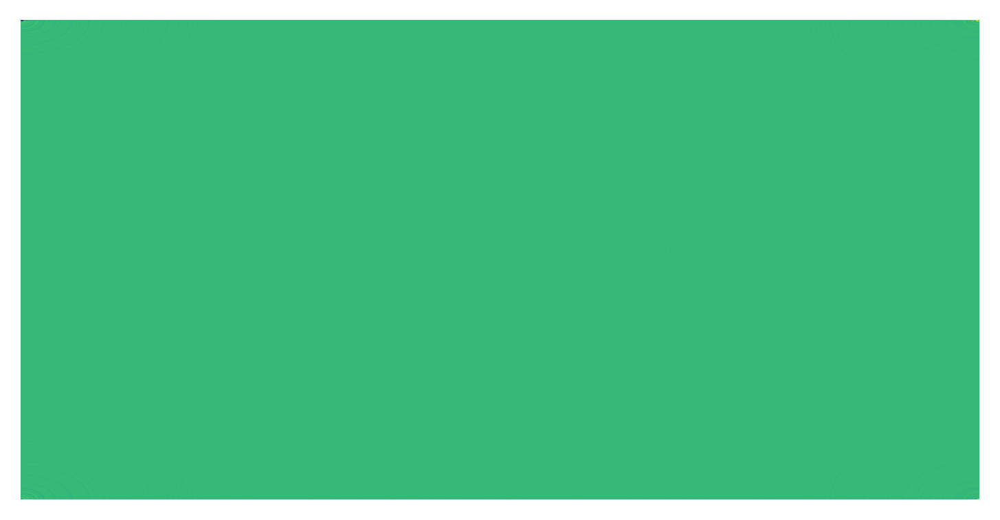

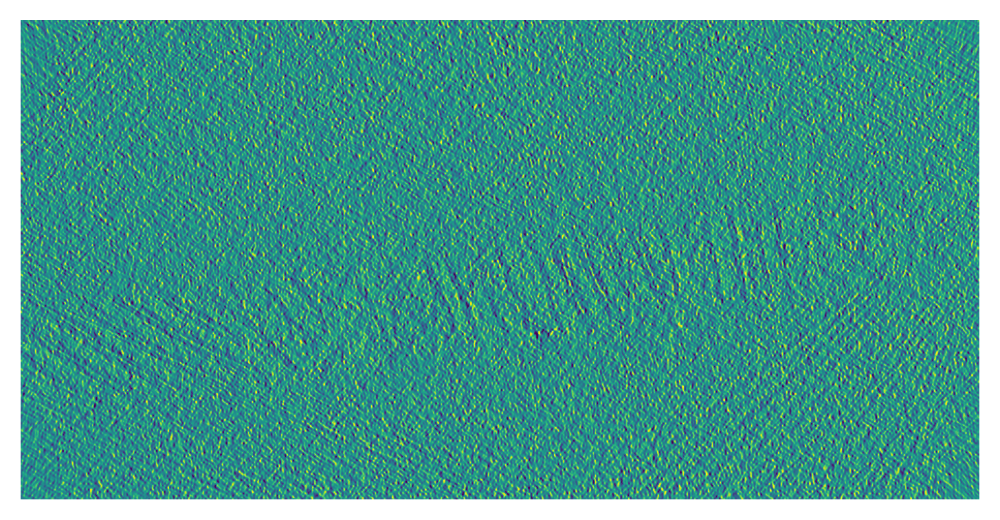

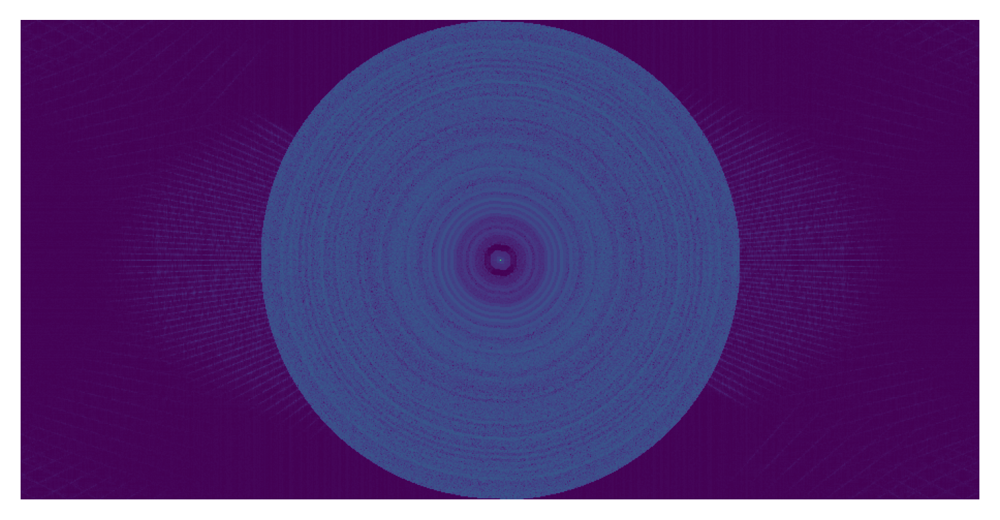

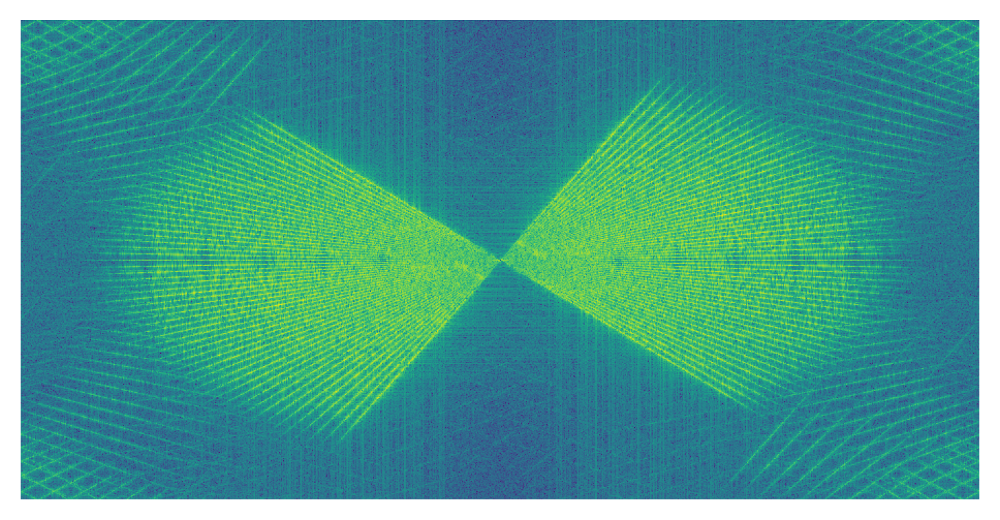

In [78]:
plt.figure(dpi = 300)
plt.imshow(recon.cpu().data.numpy())
plt.axis('off')

plt.figure(dpi = 300)
plt.imshow(_data[0, :, :].cpu().data.numpy())
plt.axis('off')

plt.figure(dpi = 300)
plt.imshow(torch.log10(torch.abs(fft.fftshift(fft.fft2(recon)))+1).cpu().data.numpy())
plt.axis('off')

plt.figure(dpi = 300)
plt.imshow(torch.log10(torch.abs(fft.fftshift(fft.fft2(_data[0, :, :])))+1).cpu().data.numpy())
plt.axis('off')

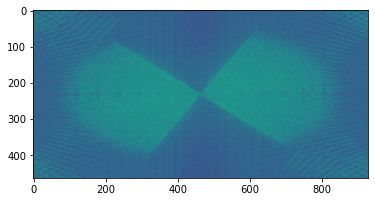

In [98]:
aux = fft.fftshift(fft.fft2(_data[0, :, :]))

x0, y0 = np.array(aux.shape) //2
x1, y1 = 10, 30
i, j = x0 - x1, x0 + x1
k, l = y0 - y1, y0 + y1
aux[i:j, k:l] += fft.fftshift(fft.fft2(recon))[i:j, k:l]

aux = aux.cpu().detach().numpy()

plt.imshow(np.log10(np.abs(aux)))

(-0.5, 927.5, 463.5, -0.5)

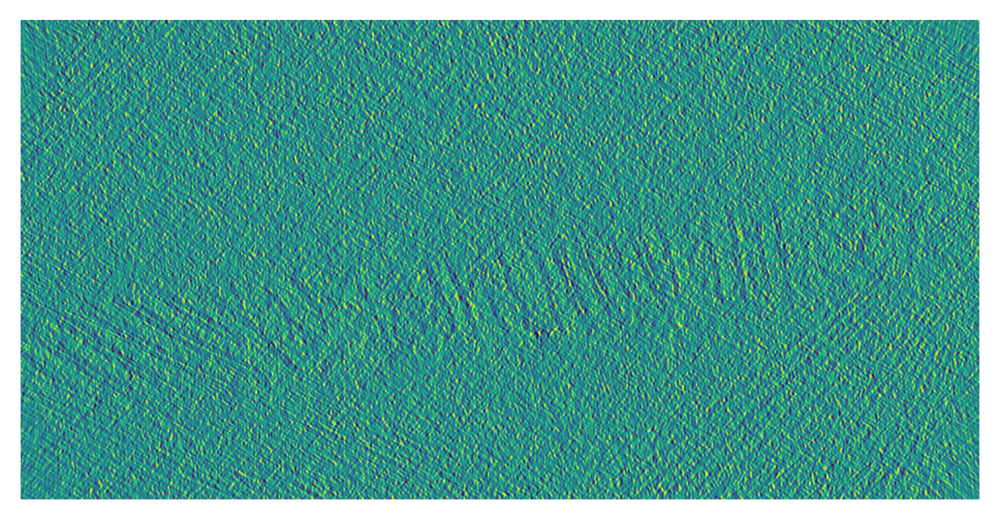

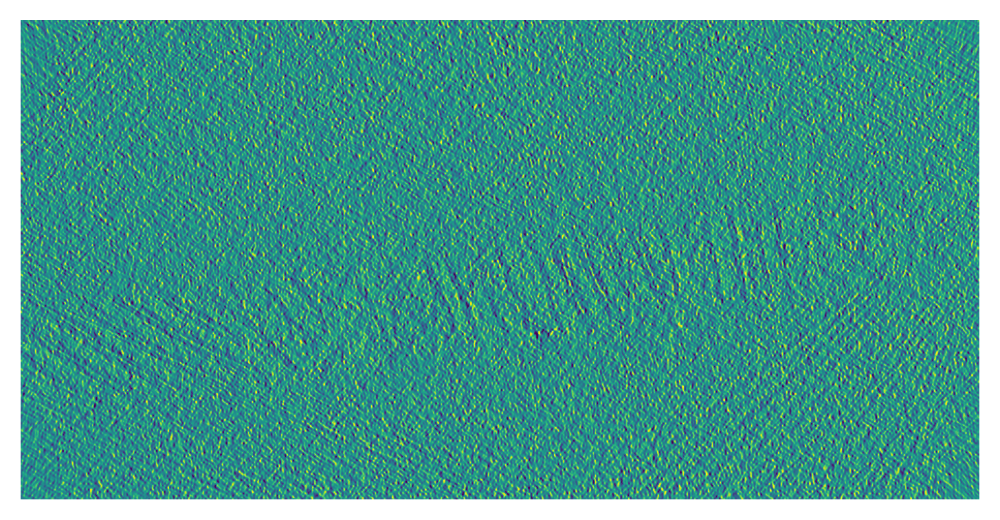

In [99]:
aux2 = fft.ifft2(fft.ifftshift(torch.tensor(aux))).real

plt.figure(dpi = 300)
plt.imshow(aux2)
plt.axis('off')

plt.figure(dpi = 300)
plt.imshow(_data[0, :, :].cpu().data.numpy())
plt.axis('off')